In [2]:
# Include sslearn folder
import sys
# sys.path.append('../../../sslearn')
# from sslearn.wrapper import CoTraining
# from sslearn.base import OneVsRestSSLClassifier
import pickle as pkl
import numpy as np
import os
from SequenceEncoding import SequenceEncoding
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_squared_error
from scipy.stats import spearmanr, weightedtau
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from itertools import combinations, permutations

# Results files reading and preprocessing

In [3]:
avgfp_results_dirs = [(2, "Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_2_avgfp_Ridge"),
                      (3, "Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_3_avgfp_Ridge"),
                      (4, "Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_4_avgfp_Ridge"),
                      (5, "Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_5_avgfp_Ridge"),
                      (6, "Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_6_avgfp_Ridge"),
                      (7, "Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_7_avgfp_Ridge"),
                      (8, "Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_8_avgfp_Ridge"),
                      (9, "Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_9_avgfp_Ridge"),
                      (10, "Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_10_avgfp_Ridge"),
                      (2, "StandardScaler_Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_2_avgfp_StandardScaler_Ridge"),
                      (3, "StandardScaler_Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_3_avgfp_StandardScaler_Ridge"),
                      (4, "StandardScaler_Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_4_avgfp_StandardScaler_Ridge"),
                      (5, "StandardScaler_Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_5_avgfp_StandardScaler_Ridge"),
                      (6, "StandardScaler_Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_6_avgfp_StandardScaler_Ridge"),
                      (7, "StandardScaler_Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_7_avgfp_StandardScaler_Ridge"),
                      (8, "StandardScaler_Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_8_avgfp_StandardScaler_Ridge"),
                      (9, "StandardScaler_Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_9_avgfp_StandardScaler_Ridge"),
                      (10, "StandardScaler_Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_10_avgfp_StandardScaler_Ridge")]
pabp_yeast_results_dirs = [(2, "Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_2_PABP_YEAST_Fields2013_Ridge"),
                           (2, "StandardScaler_Ridge", "results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_2_PABP_YEAST_Fields2013_StandardScaler_Ridge")]

results_dirs_dict = {"avgfp": avgfp_results_dirs, "PABP_YEAST_Fields2013": pabp_yeast_results_dirs}

In [4]:
encodings = ["One_hot", "One_hot_6_bit", "Binary_5_bit", "Hydrophobicity_matrix",
             "Meiler_parameters", "Acthely_factors", "PAM250", "BLOSUM62",
             "Miyazawa_energies", "Micheletti_potentials", "AESNN3",
             "ANN4D", 
             #"ProtVec"
             ]
global_masks = ["relative",
                "relativex2",
                "relativex10",
                "relativex0.5",
                "relativex0.1",
                "shannon",
                "shannonx2",
                "shannonx10",
                "shannonx0.5",
                "shannonx0.1",
                "lockless",
                "locklessx2",
                "locklessx10",
                "locklessx0.5",
                "locklessx0.1",
                "1-shannon",
                "inverted_relative",
                "inverted_shannon",
                "inverted_lockless",
                "normalized_relative",
                "normalized_shannon",
                "normalized_lockless",
                "random"]
individual_masks = ["variants_emphasis_weight_0.25",
                    "variants_emphasis_weight_0.5",
                    "variants_emphasis_weight_0.75",
                    "variants_emphasis_weight_1.5",
                    "variants_emphasis_weight_2",
                    "variants_emphasis_weight_5",
                    "variants_gaussian_emphasis_weight_0.25",
                    "variants_gaussian_emphasis_weight_0.5",
                    "variants_gaussian_emphasis_weight_0.75",
                    "variants_gaussian_emphasis_weight_1.5",
                    "variants_gaussian_emphasis_weight_2",
                    "variants_gaussian_emphasis_weight_5"]
masks = global_masks + individual_masks
labeled_sizes_list = [1, 0.75, 0.5, 0.25, 0.1, 0.05, 0.03, 0.01]

In [5]:
global_pred_dict = dict()

for dataset, results_dirs in results_dirs_dict.items():
    global_pred_dict[dataset] = dict()
    for variant_num, model, results_dir in results_dirs:
        global_pred_dict[dataset][(model, variant_num)] = dict()
        for enc in encodings:

            global_pred_dict[dataset][(model, variant_num)][enc] = dict()   
            for mask in masks:
                global_pred_dict[dataset][(model, variant_num)][f'{enc}_masked_{mask}'] = dict()
            for individual_mask in individual_masks:
                for global_mask in global_masks:
                    global_pred_dict[dataset][(model, variant_num)][f'{enc}_double_masked_{individual_mask}_and_{global_mask}'] = dict()

            for labeled_size in labeled_sizes_list:
                with open(f'{results_dir}/pred_dict_{enc}_{labeled_size}.pickle', 'rb') as f:
                    global_pred_dict[dataset][(model, variant_num)][enc][labeled_size] = pkl.load(f)
                for mask in masks:
                    with open(f'{results_dir}/pred_dict_{enc}_masked_{mask}_{labeled_size}.pickle', 'rb') as f:
                        global_pred_dict[dataset][(model, variant_num)][f'{enc}_masked_{mask}'][labeled_size] = pkl.load(f)
                for individual_mask in individual_masks:
                    for global_mask in global_masks:
                        with open(f'{results_dir}/pred_dict_{enc}_double_masked_{individual_mask}_and_{global_mask}_{labeled_size}.pickle', 'rb') as f:
                            global_pred_dict[dataset][(model, variant_num)][f'{enc}_double_masked_{individual_mask}_and_{global_mask}'][labeled_size] = pkl.load(f)

FileNotFoundError: [Errno 2] No such file or directory: 'results/masking_generalization_experiments/masking_experiments_trainedwith_1_testedwith_2_avgfp_Ridge/pred_dict_One_hot_1.pickle'

# Creation of the results dataframe

In [ ]:
# Create results dataframe
results_df = pd.DataFrame(columns=['Dataset', 'Model', 'Train N variants', 'Test N variants', 'Labeled', 'Train_size', 'Encoding', 'MSE', 'Spearman_r', 'Weighted_tau'])
for dataset, variant_and_model in global_pred_dict.items():
    for (model, variant_num), encodings in variant_and_model.items():
            for encoding, labeled_sizes in encodings.items():
                for labeled_size, folds in labeled_sizes.items():
                    for fold, results in folds.items():
                        y_proba = results["y_proba"]
                        y_test = results["original_y_test"]
                        train_size = results["train_len"]
                        mse = mean_squared_error(y_test, y_proba)
                        rmse = np.sqrt(mse)
                        spearman_r = spearmanr(y_test, y_proba)[0]
                        weighted_tau = weightedtau(y_test, y_proba)[0]
                        if "double_masked" in encoding:
                            enc_value = encoding.split("_double_masked")[0]
                            mask_value = encoding.split("_double_masked_")[1]
                        elif "masked" in encoding:
                            enc_value = encoding.split("_masked")[0]
                            mask_value = encoding.split("_masked_")[1]
                        else:
                            enc_value = encoding
                            mask_value = "unmasked"
                        results_df = pd.concat([results_df, pd.DataFrame(
                                                        {'Dataset': dataset,
                                                        'Model': model,
                                                        'Train N variants': 1,
                                                        'Test N variants': variant_num,
                                                        'Labeled': labeled_size, 
                                                        'Train_size': train_size, 
                                                        'Encoding': enc_value,
                                                        'Mask': mask_value,
                                                        'MSE': mse,
                                                        'RMSE': rmse,
                                                        'Spearman_r': spearman_r,
                                                        'Weighted_tau': weighted_tau
                                                        }, index=[0])], ignore_index=True)

In [6]:
# Save results_dataframe to file
results_df.to_csv(f'results/masking_analysis_results_dataframe.csv', index=False)

In [2]:
# Read results_dataframe from file
results_df = pd.read_csv(f'results/masking_analysis_results_dataframe.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'results/masking_analysis_results_dataframe.csv'

In [8]:
results_df[(results_df["Dataset"] == "avgfp")]

,Dataset,Model,Train N variants,Test N variants,Labeled,Train_size,Encoding,MSE,Spearman_r,Weighted_tau,Mask,RMSE
0,avgfp,Ridge,1,2,1.00,970,One_hot,2.827579e-01,0.672308,0.573864,unmasked,0.531750
1,avgfp,Ridge,1,2,0.75,727,One_hot,3.006665e-01,0.598698,0.487388,unmasked,0.548331
2,avgfp,Ridge,1,2,0.50,485,One_hot,3.519863e-01,0.469657,0.363146,unmasked,0.593284
3,avgfp,Ridge,1,2,0.25,242,One_hot,4.115309e-01,0.333700,0.234605,unmasked,0.641507
4,avgfp,Ridge,1,2,0.10,97,One_hot,4.691097e-01,0.238958,0.206847,unmasked,0.684916
...,...,...,...,...,...,...,...,...,...,...,...,...
539131,avgfp,StandardScaler_Ridge,1,10,0.25,242,ANN4D,1.906609e+03,-0.051302,-0.027873,variants_gaussian_emphasis_weight_5_and_random,43.664729
539132,avgfp,StandardScaler_Ridge,1,10,0.10,97,ANN4D,1.608017e+05,-0.186702,-0.214772,variants_gaussian_emphasis_weight_5_and_random,401.000814
539133,avgfp,StandardScaler_Ridge,1,10,0.05,48,ANN4D,6.842684e+07,0.117749,0.063516,variants_gaussian_emphasis_weight_5_and_random,8272.051973
539134,avgfp,StandardScaler_Ridge,1,10,0.03,29,ANN4D,9.315159e+06,-0.007839,0.024257,variants_gaussian_emphasis_weight_5_and_random,3052.074557


In [9]:
# Show unique values in column Test N variants
print(results_df['Test N variants'].unique())
# Show unique values in column Model
print(results_df['Model'].unique())
# Show unique values in column Dataset
print(results_df['Dataset'].unique())

[ 2  3  4  5  6  7  8  9 10]
['Ridge' 'StandardScaler_Ridge']
['avgfp' 'PABP_YEAST_Fields2013']


# Analysis of the top 5 masks for each:
 - dataset
 - model
 - labeled_size
 - encoding
 - testNvariants

In [10]:
# We want to create a new dataframe that keeps only the top 5 best masks for each encoding/dataset/model/labeled_size/test_N_variants (keeping the unmasked value too)
# To decide wich mask is the best, we will use the mean of the Spearman's correlation
# We will save the indexes of the rows that we want to keep in a list
rows_to_keep = []
# For every encoding/dataset/model/labeled_size/test_N_variants combination
for encoding, dataset, model, labeled_size, test_N_variants in results_df[['Encoding', 'Dataset', 'Model', 'Labeled', 'Test N variants']].drop_duplicates().values:
    # Get the dataframe for that combination
    df = results_df[(results_df["Encoding"] == encoding) & (results_df["Dataset"] == dataset) & (results_df["Model"] == model) & (results_df["Labeled"] == labeled_size) & (results_df["Test N variants"] == test_N_variants)]
    # Get the indexes for the top 5 best masks for that combination
    rows_to_keep.extend(df.sort_values(by="Spearman_r", ascending=False).head(5).index)
    
# Add rows with unmasked values
rows_to_keep.extend(results_df[results_df["Mask"] == "unmasked"].index)

# Add rows with random mask
rows_to_keep.extend(results_df[results_df["Mask"] == "random"].index)

# Create a new dataframe keeping removing the masks that are not in the top 5
results_df_top5 = results_df[results_df.index.isin(rows_to_keep)].copy()
results_df_top5

,Dataset,Model,Train N variants,Test N variants,Labeled,Train_size,Encoding,MSE,Spearman_r,Weighted_tau,Mask,RMSE
0,avgfp,Ridge,1,2,1.00,970,One_hot,0.282758,0.672308,0.573864,unmasked,0.531750
1,avgfp,Ridge,1,2,0.75,727,One_hot,0.300666,0.598698,0.487388,unmasked,0.548331
2,avgfp,Ridge,1,2,0.50,485,One_hot,0.351986,0.469657,0.363146,unmasked,0.593284
3,avgfp,Ridge,1,2,0.25,242,One_hot,0.411531,0.333700,0.234605,unmasked,0.641507
4,avgfp,Ridge,1,2,0.10,97,One_hot,0.469110,0.238958,0.206847,unmasked,0.684916
...,...,...,...,...,...,...,...,...,...,...,...,...
598719,PABP_YEAST_Fields2013,StandardScaler_Ridge,1,2,0.01,11,ANN4D,24958.643783,0.217176,0.089164,variants_gaussian_emphasis_weight_2_and_shannon,157.983049
598727,PABP_YEAST_Fields2013,StandardScaler_Ridge,1,2,0.01,11,ANN4D,24958.643783,0.217176,0.089164,variants_gaussian_emphasis_weight_2_and_shannonx2,157.983049
598735,PABP_YEAST_Fields2013,StandardScaler_Ridge,1,2,0.01,11,ANN4D,24958.643783,0.217176,0.089164,variants_gaussian_emphasis_weight_2_and_shanno...,157.983049
598743,PABP_YEAST_Fields2013,StandardScaler_Ridge,1,2,0.01,11,ANN4D,24958.643783,0.217176,0.089164,variants_gaussian_emphasis_weight_2_and_shanno...,157.983049


In [11]:
# Save results_df_top5 to file
results_df_top5.to_csv(f'results/masking_analysis_results_dataframe_top5.csv', index=False)

In [12]:
# Read results_df_top5 from file
results_df_top5 = pd.read_csv(f'results/masking_analysis_results_dataframe_top5.csv')

In [13]:
df = results_df_top5
#df = results_df

## Plot masks results for each mask/labeled_size

In [14]:
# Fixed parameters
encoding = "One_hot"
model = "Ridge"
metric = "Spearman_r"

<Figure size 2500x500 with 0 Axes>

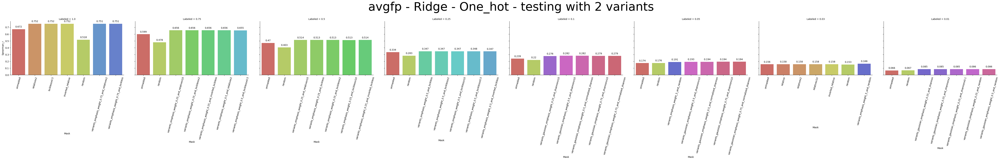

<Figure size 2500x500 with 0 Axes>

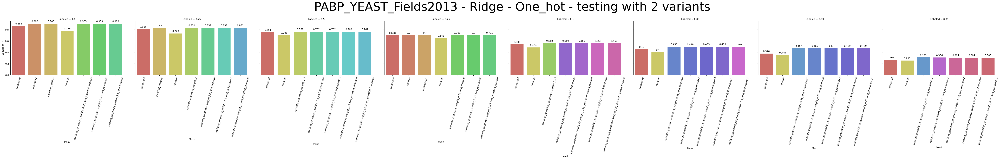

<Figure size 2500x500 with 0 Axes>

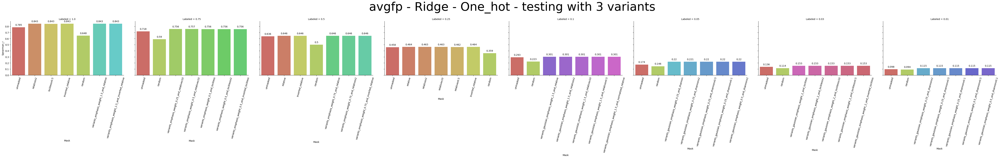

<Figure size 2500x500 with 0 Axes>

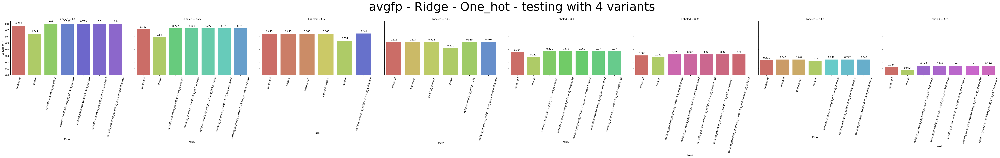

<Figure size 2500x500 with 0 Axes>

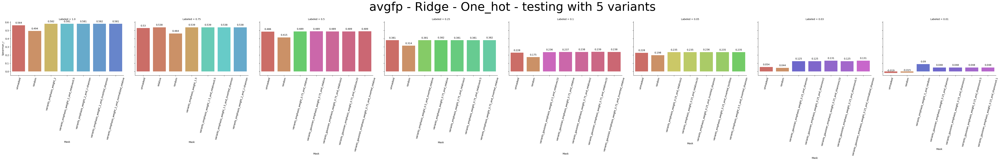

<Figure size 2500x500 with 0 Axes>

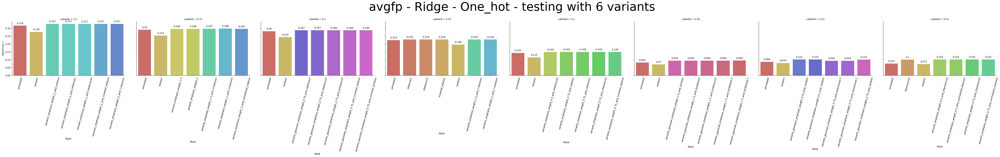

<Figure size 2500x500 with 0 Axes>

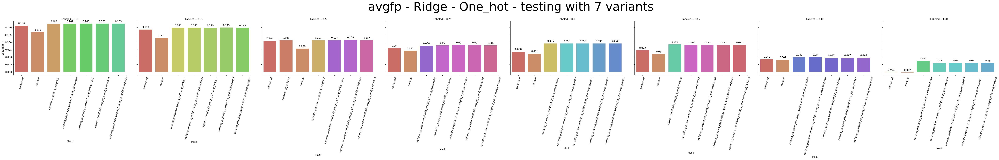

<Figure size 2500x500 with 0 Axes>

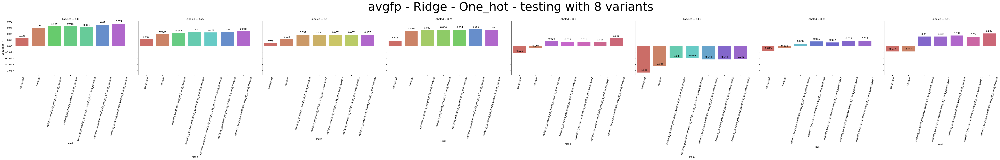

<Figure size 2500x500 with 0 Axes>

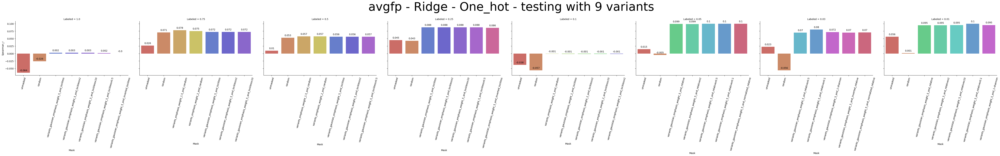

<Figure size 2500x500 with 0 Axes>

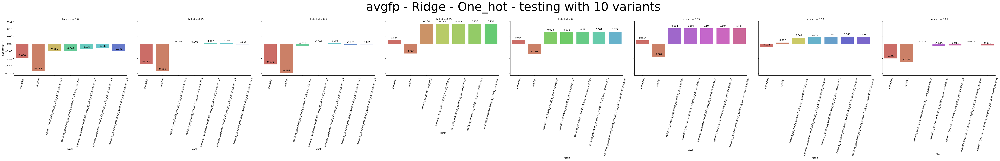

In [15]:
# Plot for every pair Dataset/Test N variants
for dataset, test_N_variants in df[['Dataset', 'Test N variants']].drop_duplicates().sort_values(by="Test N variants").values:
    # Now do the same buy in a single plot grouping the masks by labeled_size
    plt.figure(figsize=(25, 5))

    plt_df = df[(df["Encoding"] == encoding) & (df["Model"] == model) & (df["Dataset"] == dataset) & (df["Test N variants"] == test_N_variants)]

    # Remove the empty bars in the plot
    g = sns.catplot(kind='bar',
                data=plt_df,
                col='Labeled',
                x='Mask', 
                y=metric,
                hue='Mask', dodge=False, sharex=False,
                height=5, aspect=1.5, legend_out=False,
                col_order=sorted(df[df["Encoding"] == encoding]["Labeled"].unique(), reverse=True),
                palette=sns.color_palette("hls", len(plt_df["Mask"].unique())).copy()
                )
    # Show values on top of the bars
    for ax in g.axes.flat:
        for p in ax.patches:
            ax.annotate(str(round(p.get_height(), 3)), (p.get_x() + p.get_width() / 2., p.get_height()), 
                        ha='center', va='center', xytext=(0, 10), textcoords='offset points')
    # Put the groups closer
    g.fig.subplots_adjust(wspace=0.1)
    # Title
    g.fig.suptitle(f'{dataset} - {model} - {encoding} - testing with {test_N_variants} variants', fontsize=50)
    # Some space below the title
    g.fig.subplots_adjust(top=0.75)

    # Tilt the x labels 75 degrees
    g.set_xticklabels(rotation=75)

    plt.show()

In [16]:
# Fixed parameters
encoding = "One_hot"
model = "StandardScaler_Ridge"
metric = "Spearman_r"

<Figure size 2500x500 with 0 Axes>

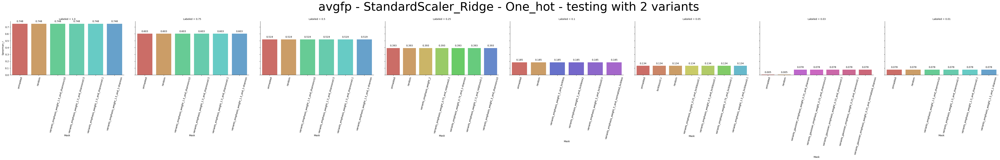

<Figure size 2500x500 with 0 Axes>

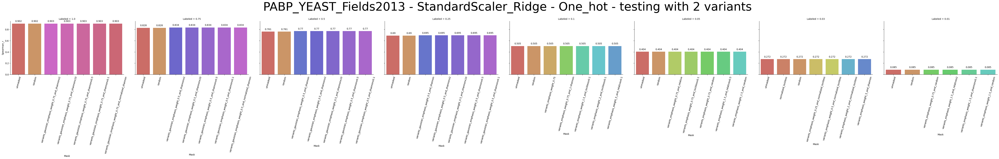

<Figure size 2500x500 with 0 Axes>

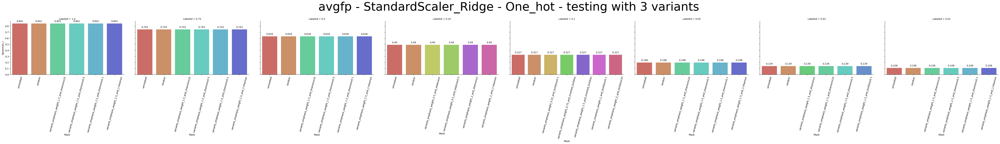

<Figure size 2500x500 with 0 Axes>

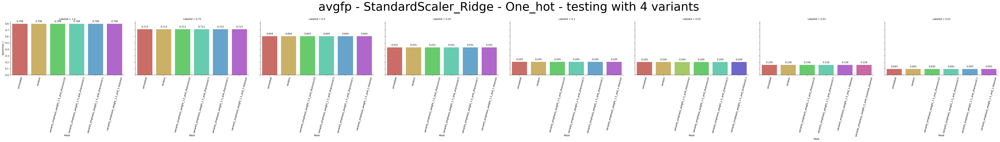

<Figure size 2500x500 with 0 Axes>

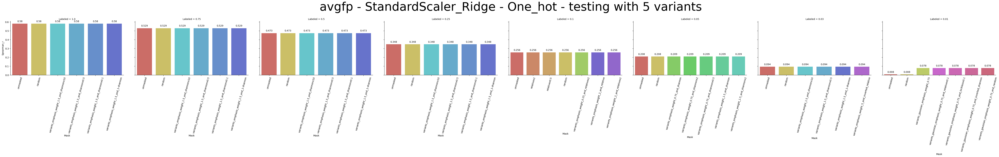

<Figure size 2500x500 with 0 Axes>

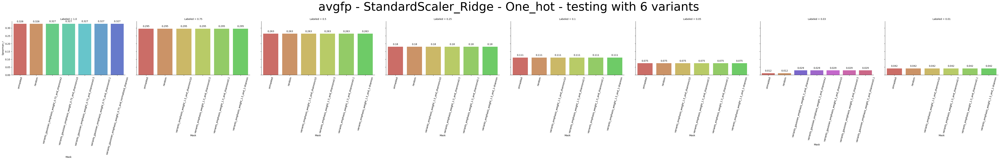

<Figure size 2500x500 with 0 Axes>

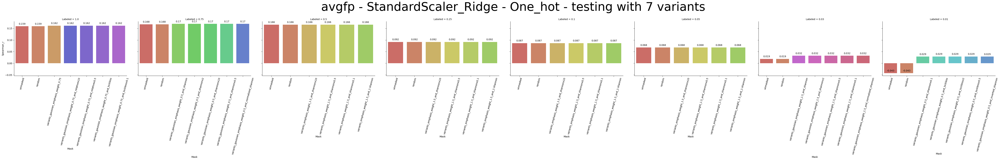

<Figure size 2500x500 with 0 Axes>

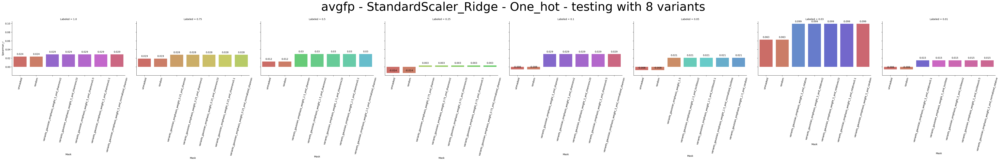

<Figure size 2500x500 with 0 Axes>

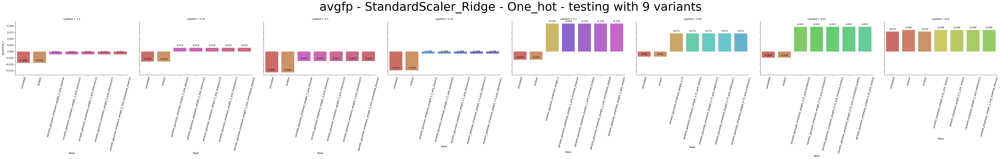

<Figure size 2500x500 with 0 Axes>

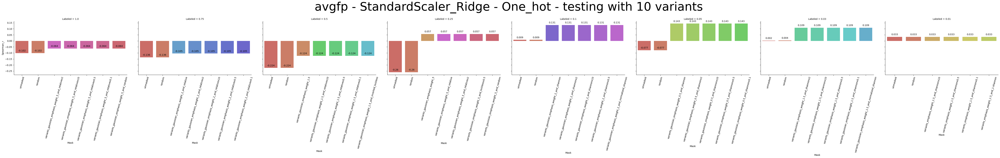

In [17]:
# Plot for every pair Dataset/Test N variants
for dataset, test_N_variants in df[['Dataset', 'Test N variants']].drop_duplicates().sort_values(by="Test N variants").values:
    # Now do the same buy in a single plot grouping the masks by labeled_size
    plt.figure(figsize=(25, 5))

    plt_df = df[(df["Encoding"] == encoding) & (df["Model"] == model) & (df["Dataset"] == dataset) & (df["Test N variants"] == test_N_variants)]
    # Remove the empty bars in the plot
    g = sns.catplot(kind='bar',
                data=plt_df,
                col='Labeled',
                x='Mask', 
                y=metric,
                hue='Mask', dodge=False, sharex=False,
                height=5, aspect=1.5, legend_out=False,
                col_order=sorted(df[df["Encoding"] == encoding]["Labeled"].unique(), reverse=True),
                palette=sns.color_palette("hls", len(plt_df["Mask"].unique())).copy()
                )
    # Show values on top of the bars
    for ax in g.axes.flat:
        for p in ax.patches:
            ax.annotate(str(round(p.get_height(), 3)), (p.get_x() + p.get_width() / 2., p.get_height()), 
                        ha='center', va='center', xytext=(0, 10), textcoords='offset points')
    # Put the groups closer
    g.fig.subplots_adjust(wspace=0.1)
    # Title
    g.fig.suptitle(f'{dataset} - {model} - {encoding} - testing with {test_N_variants} variants', fontsize=50)
    # Some space below the title
    g.fig.subplots_adjust(top=0.75)

    # Tilt the x labels 75 degrees
    g.set_xticklabels(rotation=75)

    plt.show()

In [18]:
# Fixed parameters
encoding = "One_hot"
labeled_size = 1
test_N_variants = 2

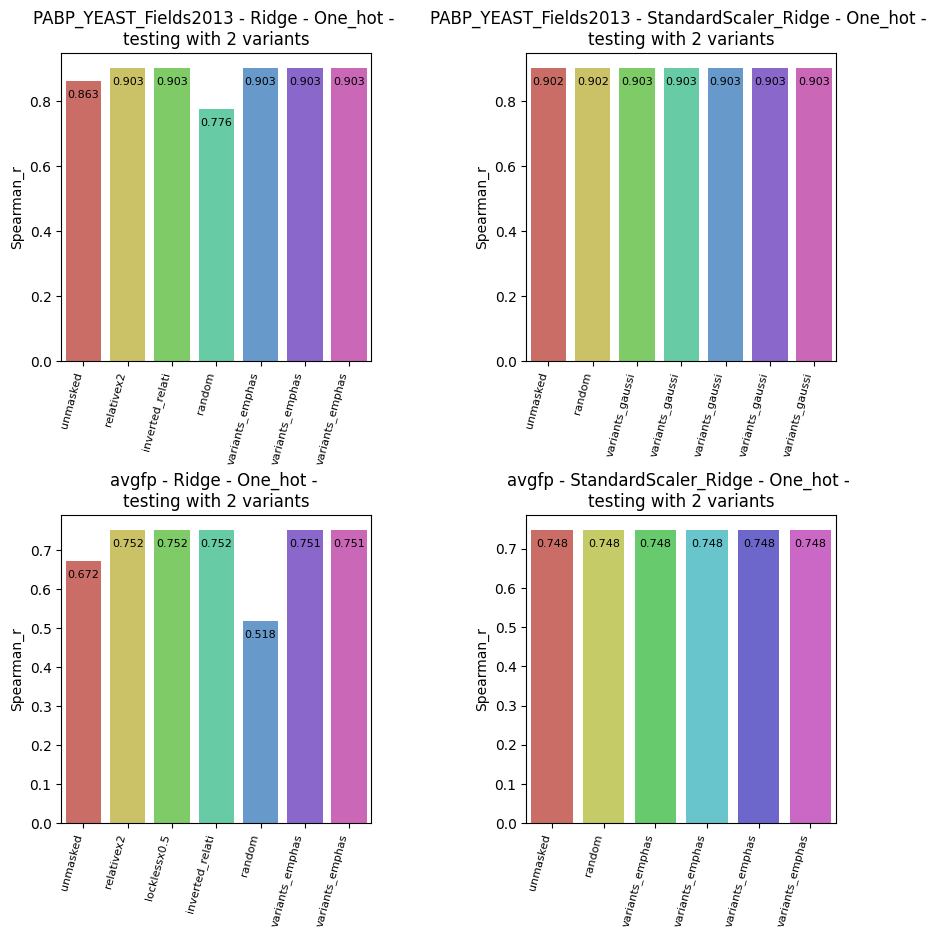

In [19]:
# Subplot catplot for every dataset/model pair
number_of_datasets = len(df[df["Encoding"] == encoding]["Dataset"].unique())
number_of_models = len(df[df["Encoding"] == encoding]["Model"].unique())
fig, axs = plt.subplots(number_of_datasets, number_of_models, figsize=(number_of_models*5, number_of_datasets*5))
for i, dataset in enumerate(sorted(df[df["Encoding"] == encoding]["Dataset"].unique())):
    for j, model in enumerate(sorted(df[df["Encoding"] == encoding]["Model"].unique())):

        # Now do the same buy in a single plot grouping the masks by labeled_size
        plt_df = df[(df["Encoding"] == encoding) & (df["Model"] == model) & (df["Dataset"] == dataset) & (df["Labeled"] == labeled_size) & (df["Test N variants"] == test_N_variants)]

        # Remove the empty bars in the plot
        g = sns.barplot(data=plt_df,
                    x='Mask', 
                    y='Spearman_r',
                    hue='Mask', dodge=False, 
                    ax=axs[i, j],
                    palette=sns.color_palette("hls", len(plt_df["Mask"].unique())).copy()
                    )
        # Show values at the top of the bars (inside them)
        for p in g.patches:
            g.annotate(str(round(p.get_height(), 3)), (p.get_x() + p.get_width() / 2., p.get_height()), 
                        ha='center', va='center', xytext=(0, -10), textcoords='offset points', fontsize=8)
        # Title
        g.set_title(f'{dataset} - {model} - {encoding} - \ntesting with {test_N_variants} variants', fontsize=12)
        
        # Hide x labels
        g.set_xlabel("")
        
        # Tilt the x labels 75 degrees
        g.set_xticklabels(g.get_xticklabels(), rotation=75, ha="right", fontsize=8)
        # x labels sometimes are too long so we need to shorten them
        g.set_xticklabels([x.get_text()[:15] for x in g.get_xticklabels()])
        # Remove the legend
        g.get_legend().remove()
        # More space between the subplots
        fig.subplots_adjust(hspace=0.5, wspace=0.5)